<a href="https://colab.research.google.com/github/Bingurrr/slam/blob/main/Feature_Matching.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Feature Matching
---

OpenCV를 사용하여 feature description을 얻어내고, 이를 이용해 feature matching을 진행한다.

- 지난 시간에 얻은 ORB feature, SIFT feature 등에 대한 description을 얻어낸다.
- 이를 이용해 두 이미지 간의 feature matching을 진행한다.


**참고**

- [OpenCV tutorial - Feature Detection and Description](https://docs.opencv.org/master/db/d27/tutorial_py_table_of_contents_feature2d.html)
- [OpenCV document](https://docs.opencv.org/3.4/d0/d13/classcv_1_1Feature2D.html#a8be0d1c20b08eb867184b8d74c15a677)
- Colab에서 코드에 이상이 없음에도 불구하고 결과가 제대로 나오지 않을 경우, '런타임 다시 시작...'을 해보도록 한다.

---

In [ ]:
import sys
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

print('python', sys.version)
print('numpy', np.__version__)
print('opencv', cv.__version__)

python 3.7.10 (default, May  3 2021, 02:48:31) 
[GCC 7.5.0]
numpy 1.19.5
opencv 4.5.2


In [ ]:
# mount
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
ROOT = '/content/drive/MyDrive/slam/hw1/'

### opencv를 사용해 이미지 불러오기

- `cv.imread()`를 이용해 이미지를 불러오면 RGB가 아닌 BGR 이미지임을 유의해야 한다.

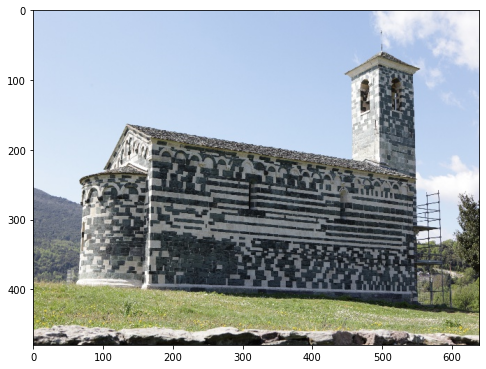

In [ ]:
img = cv.imread(ROOT + 'feature/DPP_0010.JPG')

plt.figure(figsize=(8,8))
plt.imshow(img[:,:,::-1])
plt.show()

## Brute-Force Matching

brute-force matcher를 사용해 feature matching을 진행한다.

### feature matching을 진행할 두 이미지 불러오기

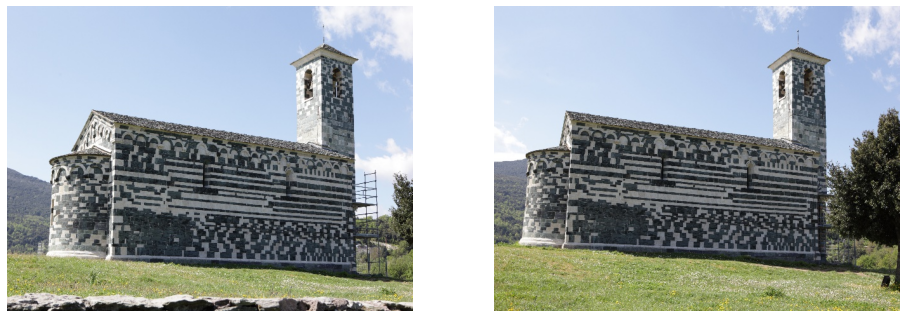

In [ ]:
img1 = cv.imread(ROOT + 'feature/DPP_0010.JPG')
img2 = cv.imread(ROOT + 'feature/DPP_0011.JPG')

plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(img1[:,:,::-1])
plt.axis('off')
plt.subplot(122)
plt.imshow(img2[:,:,::-1])
plt.axis('off')
plt.show()

### ORB feature 얻기

지난 과제를 통해 실습한 ORB feature를 구한다.

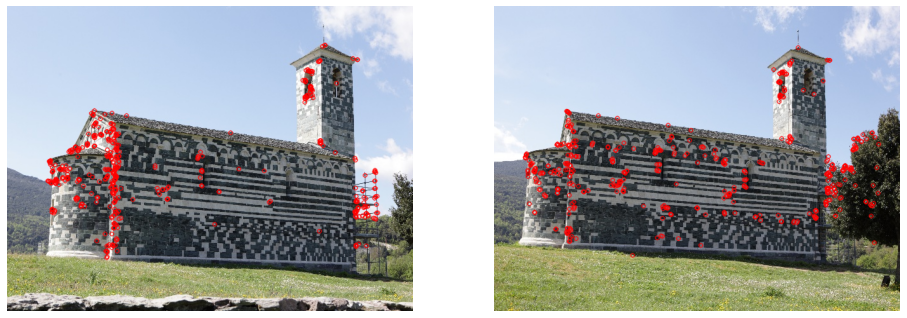

In [ ]:
img1 = cv.imread(ROOT + 'feature/DPP_0010.JPG')
img2 = cv.imread(ROOT + 'feature/DPP_0011.JPG')

gray1 = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
gray2 = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)

# To-do : 각 이미지에 대해 orb feature를 얻고 시각화하기
orb = cv.ORB_create(500)
kp1 = orb.detect(gray1,None)
orb_kps_img1 = cv.drawKeypoints(img1, kp1, None, color=(0,0,255),  flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)


kp2 = orb.detect(gray2,None)
# kp2, des2 = orb.compute(gray2, kp)
orb_kps_img2 = cv.drawKeypoints(img2, kp2, None, color=(0,0,255),  flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)



plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(orb_kps_img1[:,:,::-1])
plt.axis('off')
plt.subplot(122)
plt.imshow(orb_kps_img2[:,:,::-1])
plt.axis('off')
plt.show()

### ORB descriptor 구하기


- 찾은 feature에 대해 descriptor를 구한다.

관련 함수

- `	keypoints, descriptors	=	cv.Feature2D.compute(	image, keypoints[, descriptors]	)`
- `keypoints, descriptors	=	cv.Feature2D.detectAndCompute(	image, mask[, descriptors[, useProvidedKeypoints]]	)`

In [ ]:
# To-do
kp1, des1 = orb.detectAndCompute(img1, None)

kp2, des2 = orb.detectAndCompute(img2, None)


### Brute-Force Matching


- feature matching을 진행하고 시각화한다.
- matcher에 cycle consistency를 추가하여 두 이미지를 비교한다.

관련 함수

`	<BFMatcher object>	=	cv.BFMatcher(	[, normType[, crossCheck]]	)
`


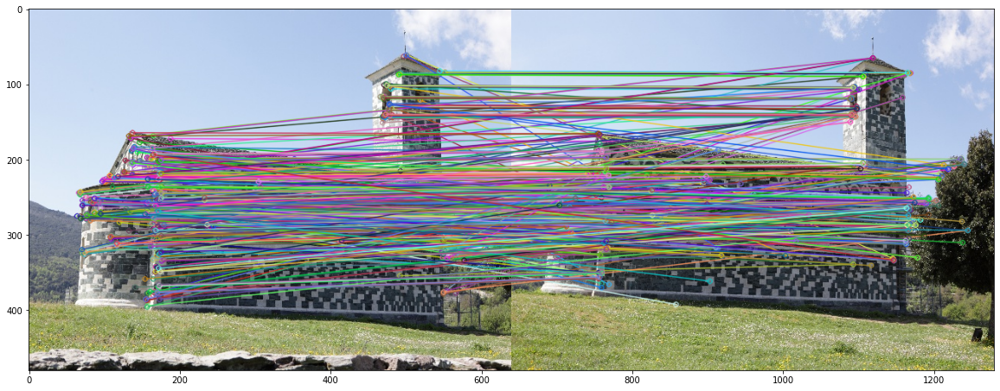

In [ ]:
# To-do
matcher = cv.BFMatcher(cv.NORM_HAMMING)

matches = matcher.match(des1, des2)

img3 = cv.drawMatches(img1, kp1, img2, kp2, matches, None, 
                      flags = cv.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(20,20))
plt.imshow(img3[:,:,::-1])

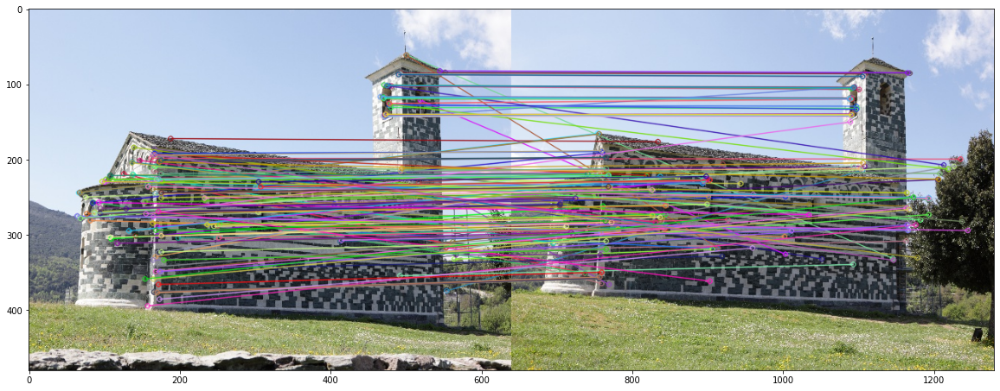

In [ ]:
# To-do
matcher = cv.BFMatcher(cv.NORM_HAMMING, crossCheck = True)

matches = matcher.match(des1, des2)

img3 = cv.drawMatches(img1, kp1, img2, kp2, matches, None, flags = cv.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(20,20))

plt.imshow(img3[:,:,::-1])

In [ ]:
# 결과 이미지 예시

### SIFT feature 얻기

이번 단계에서는 SIFT feature에 대해 매칭을 진행한다.

지난 과제를 통해 실습한 SIFT feature를 구한다.

In [ ]:
# !pip uninstall opencv-contrib-python
# !pip uninstall opencv-python
# !pip install opencv-python 
# !pip install opencv-contrib-python 

In [ ]:
# !pip install opencv-contrib-python

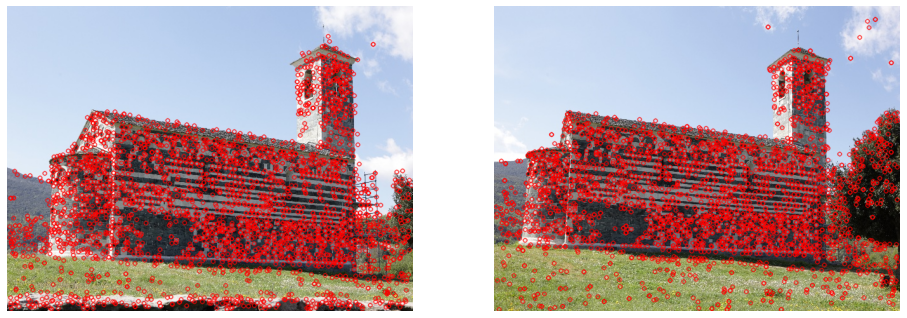

In [ ]:
img1 = cv.imread(ROOT + 'feature/DPP_0010.JPG')
img2 = cv.imread(ROOT + 'feature/DPP_0011.JPG')
gray1 = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
gray2 = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)
# To-do : 각 이미지에 대해 SIFT feature를 얻고 시각화하기
sift = cv.SIFT_create()

kp1 = sift.detect(gray1,None)
sift_kps_img1 = cv.drawKeypoints(img1, kp1, None, color=(0,0,255),  flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

kp2 = sift.detect(gray2,None)
sift_kps_img2 = cv.drawKeypoints(img2, kp2, None, color=(0,0,255),  flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)



plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(sift_kps_img1[:,:,::-1])
plt.axis('off')
plt.subplot(122)
plt.imshow(sift_kps_img2[:,:,::-1])
plt.axis('off')
plt.show()


### SIFT descriptor 구하기


- 찾은 feature에 대해 descriptor를 구한다.

관련 함수

- `	keypoints, descriptors	=	cv.Feature2D.compute(	image, keypoints[, descriptors]	)`
- `keypoints, descriptors	=	cv.Feature2D.detectAndCompute(	image, mask[, descriptors[, useProvidedKeypoints]]	)`

In [ ]:
# To-do
kp1, des1 = sift.detectAndCompute(img1, None)

kp2, des2 = sift.detectAndCompute(img2, None)


### Brute-Force Matching

**과제** 
- feature matching을 진행하고 시각화한다.
- matcher에 cycle consistency를 추가하여 두 이미지를 비교한다.

관련 함수

`	<BFMatcher object>	=	cv.BFMatcher(	[, normType[, crossCheck]]	)
`


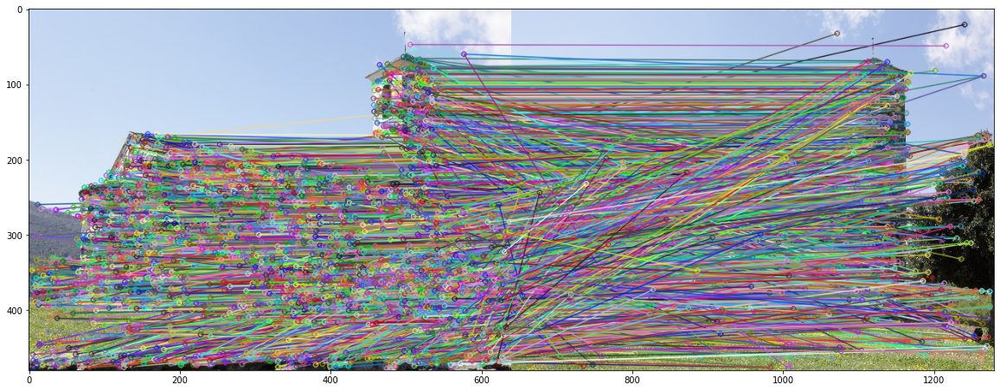

In [ ]:
# To-do
matcher = cv.BFMatcher(cv.NORM_L1)

matches = matcher.match(des1, des2)


img3 = cv.drawMatches(img1, kp1, img2, kp2, matches, None, 
                      flags = cv.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(20,20))
plt.imshow(img3[:,:,::-1])

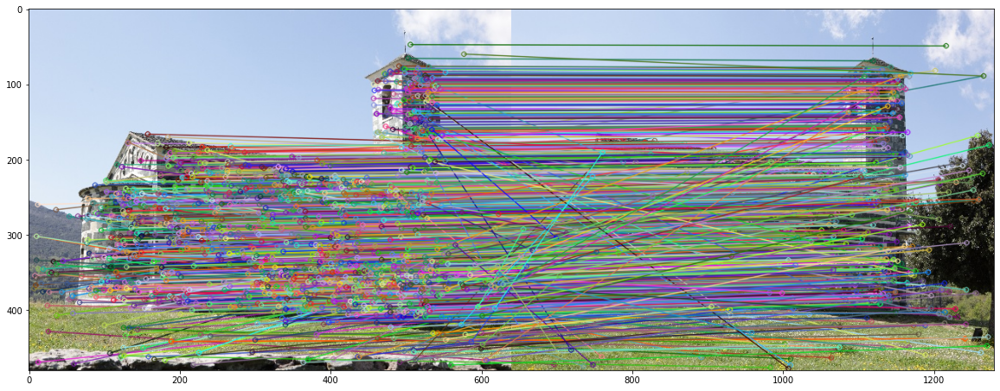

In [ ]:
# To-do
matcher = cv.BFMatcher(cv.NORM_L1, crossCheck = True)

matches = matcher.match(des1, des2)


img3 = cv.drawMatches(img1, kp1, img2, kp2, matches, None, flags = cv.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(20,20))
plt.imshow(img3[:,:,::-1])

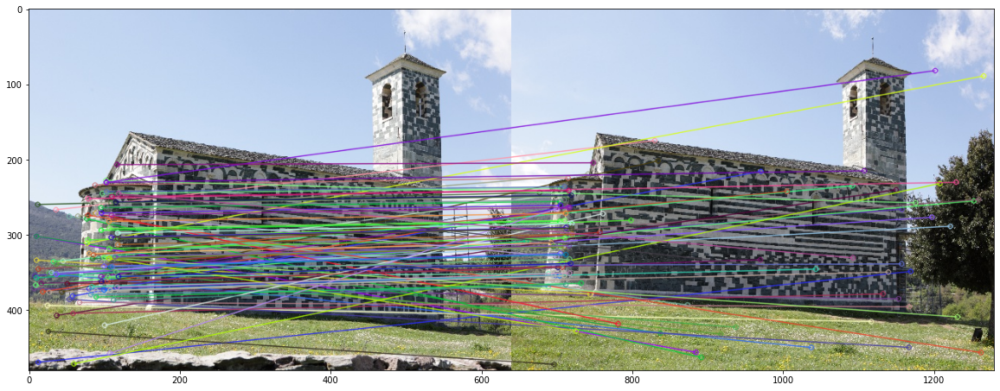

In [ ]:
matcher = cv.BFMatcher(cv.NORM_L1, crossCheck = True)

matches = matcher.match(des1, des2)
matches2 = matcher.match(des2, des1)


img3 = cv.drawMatches(img1, kp1, img2, kp2, matches[:100], None, flags = cv.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(20,20))
plt.imshow(img3[:,:,::-1])

## 다른 이미지에도 적용해보기

위 실습을 바탕으로 주어진 이미지 외에 다른 이미지에도 feature matching을 진행한다. 

- 한 물체를 다른 각도에서 찍은 이미지 2장을 불러온다. (직접 찍은 사진, 인터넷에서 다운로드한 사진 모두 가능)
- 이미지들에 대해 feature matching을 진행한다.
  - feature descriptor는 자유롭게 하나를 선택한다.
  - cycle consistency를 추가한 것과 아닌 것을 비교한다.


In [ ]:
# To-do
root1 = '/content/drive/MyDrive/slam/hw1/test/맨해튼다리.JPG'
root2 = '/content/drive/MyDrive/slam/hw1/test/맨해튼다리2.JPG'

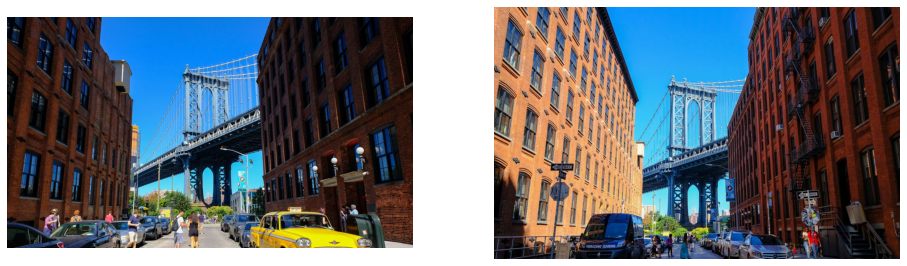

In [ ]:
img1 = cv.imread(root1)
img2 = cv.imread(root2)

plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(img1[:,:,::-1])
plt.axis('off')
plt.subplot(122)
plt.imshow(img2[:,:,::-1])
plt.axis('off')
plt.show()

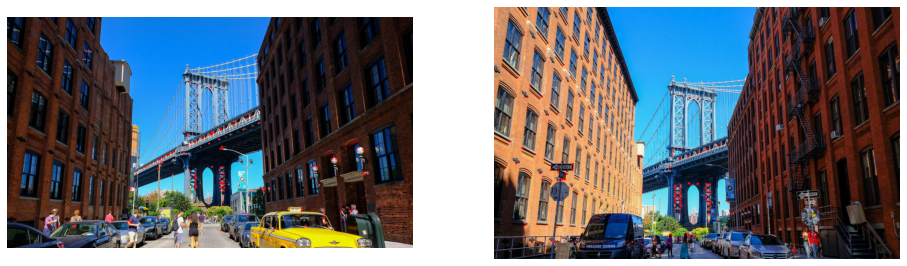

In [ ]:
img1 = cv.imread(root1)
img2 = cv.imread(root2)

gray1 = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
gray2 = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)

# To-do : 각 이미지에 대해 orb feature를 얻고 시각화하기
orb = cv.ORB_create(500)
kp1 = orb.detect(gray1,None)
orb_kps_img1 = cv.drawKeypoints(img1, kp1, None, color=(0,0,255),  flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)


kp2 = orb.detect(gray2,None)
# kp2, des2 = orb.compute(gray2, kp)
orb_kps_img2 = cv.drawKeypoints(img2, kp2, None, color=(0,0,255),  flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)



plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(orb_kps_img1[:,:,::-1])
plt.axis('off')
plt.subplot(122)
plt.imshow(orb_kps_img2[:,:,::-1])
plt.axis('off')
plt.show()

In [ ]:
kp1, des1 = orb.compute(gray1, kp1)

kp2, des2 = orb.compute(gray2, kp2)

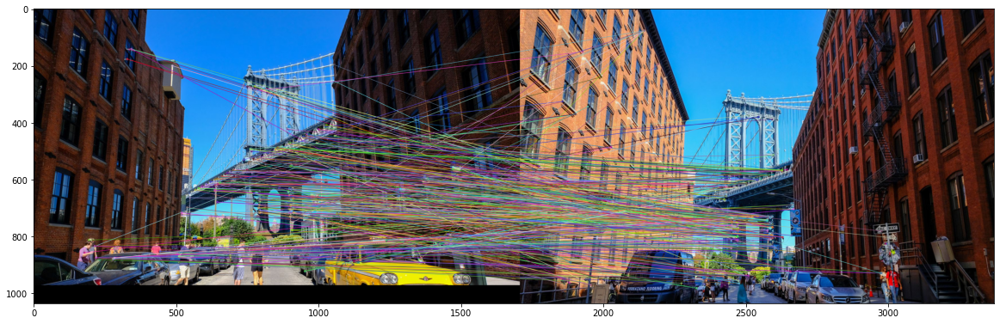

In [ ]:
matcher = cv.BFMatcher()

matches = matcher.match(des1, des2)

img3 = cv.drawMatches(img1, kp1, img2, kp2, matches, None, 
                      flags = cv.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(20,20))
plt.imshow(img3[:,:,::-1])

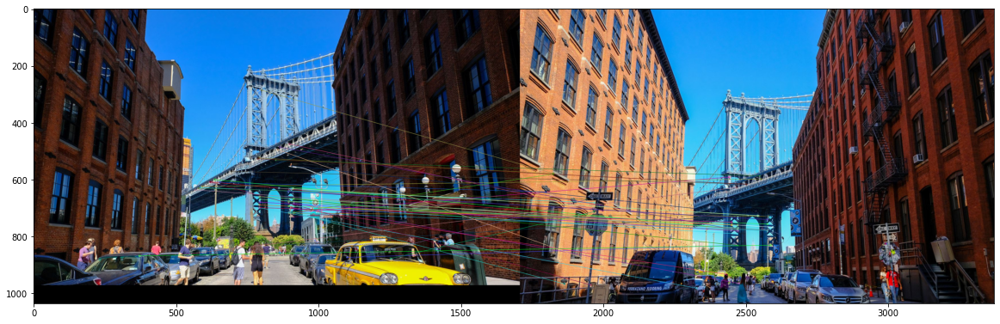

In [ ]:
matcher = cv.BFMatcher(cv.NORM_L1, crossCheck = True)

matches = matcher.match(des1, des2)

img3 = cv.drawMatches(img1, kp1, img2, kp2, matches[0:50], None, flags = cv.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(20,20))
plt.imshow(img3[:,:,::-1])

## 추가 

- opencv에서는`BFMathcer` 외의 다른 matcher를 제공한다. 이러한 다른 matcher를 이용해 같은 과정을 진행한다.
- 해당 matcher에 대해 간단히 조사해 보고, 각 과정에 대한 설명도 기술한다.

이미지를 불러온다.

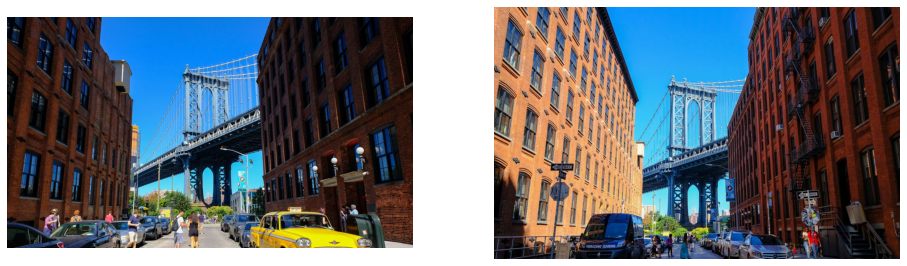

In [ ]:
# To-do
root1 = '/content/drive/MyDrive/slam/hw1/test/맨해튼다리.JPG'
root2 = '/content/drive/MyDrive/slam/hw1/test/맨해튼다리2.JPG'

img1 = cv.imread(root1)
img2 = cv.imread(root2)

plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(img1[:,:,::-1])
plt.axis('off')
plt.subplot(122)
plt.imshow(img2[:,:,::-1])
plt.axis('off')
plt.show()

SIFT feature를 표현해 본다.

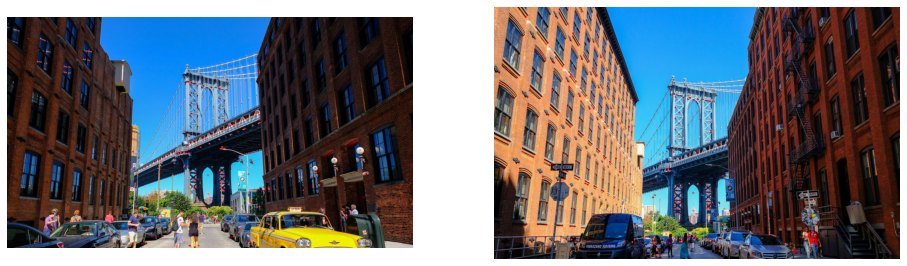

In [ ]:
sift = cv.SIFT_create(500)

kp1 = sift.detect(gray1,None)
sift_kps_img1 = cv.drawKeypoints(img1, kp1, None, color=(0,0,255),  flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)


kp2 = sift.detect(gray2,None)
sift_kps_img2 = cv.drawKeypoints(img2, kp2, None, color=(0,0,255),  flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)



plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(sift_kps_img1[:,:,::-1])
plt.axis('off')
plt.subplot(122)
plt.imshow(sift_kps_img2[:,:,::-1])
plt.axis('off')
plt.show()

Flann matching

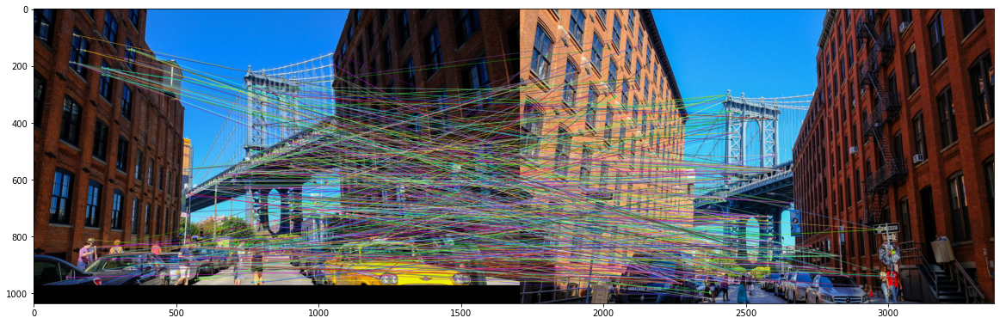

In [ ]:
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# FLANN값 설정
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)  
# 특징점 매칭 알고리즘
flann = cv.FlannBasedMatcher(index_params,search_params)

#특징점 매칭
matches = flann.match(des1, des2)

img3 = cv.drawMatches(img1, kp1, img2, kp2, matches, None, flags = 2)

plt.figure(figsize=(20,20))
plt.imshow(img3[:,:,::-1])

Flann matching

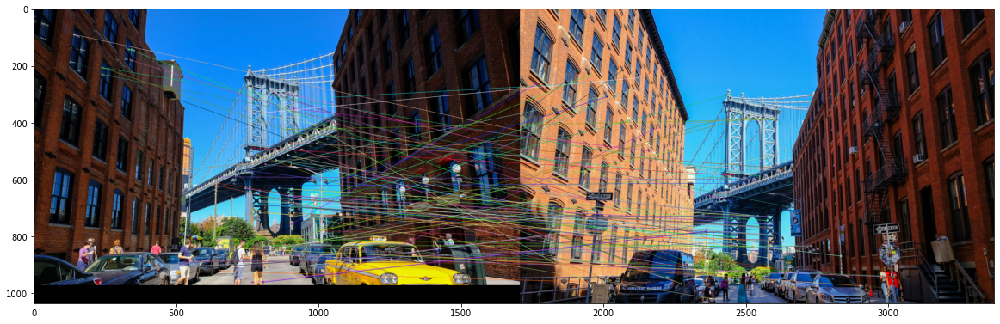

In [ ]:
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# FLANN값 설정
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=10)  
# 특징점 매칭 알고리즘
flann = cv.FlannBasedMatcher(index_params,search_params)

#특징점 매칭
matches = flann.match(des1, des2, 2)
matches2 = flann.match(des2, des1, 2)

good = []

for m in matches:
  a = m.queryIdx
  if matches2[m.trainIdx].trainIdx == a :
    good.append([m])

img3 = cv.drawMatchesKnn(img1, kp1, img2, kp2, good, None, flags = 2)

plt.figure(figsize=(20,20))
plt.imshow(img3[:,:,::-1])

opencv에서는BFMathcer 외의 다른 matcher를 제공한다. 이러한 다른 matcher를 이용해 같은 과정을 진행한다.
해당 matcher에 대해 간단히 조사해 보고, 각 과정에 대한 설명도 기술한다





FLANN matcher을 사용하여 matching을 하였다.

FLANN은 Fast Library for Approximate Nearest Neighboors를 줄인 말이며, 큰 이미지나 큰 데이테셋에서 feature를 매칭할 때 효율적이다. Brute-Force 매칭은 전수조사를 하는 반면에 FLANN에서는 이웃하는 디스크립터를 비교하여 조금더 빠르다.

이미지의 keypoint, descriptor을 추출 한 후
FLANN의 값들을 설정했다.

index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)

search_params = dict(checks=50)   

FLANN matcher을 사용할 때에는 두 개의 딕셔너리 타입을 사용해야 한다. index_params, search_params를 사용해야 한다.
index_parmas는 알고리즘을 뜻하며 search_params는 인덱스 내에서 얼마나 반복하며 왔다갔다하는 지를 정해준다. 높은 값 일수록 정확도가 높아지지만 시간이 더 오래 걸리게 된다. checks값으 50은 50개의 값들을 비교하여 그 중 가장 최적의 값을 찾아 내게 된다.


위 과정을 통하여 얻은 값 들을 통해 매칭을 시겼고 이를 시각화 하였다